Stencil code for mini project #2. **Please make a copy before modifying the code.**

Created by Calvin Luo (calvin_luo@brown.edu)

In [1]:
import tensorflow.compat.v2 as tf
tf.enable_v2_behavior()
import tensorflow_probability as tfp
tfd = tfp.distributions
import tensorflow.keras.layers as tfkl
from tensorflow.keras.utils import Progbar

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import copy

import imageio
import os
import shutil

from IPython.display import Image

2023-04-23 20:23:39.317267: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


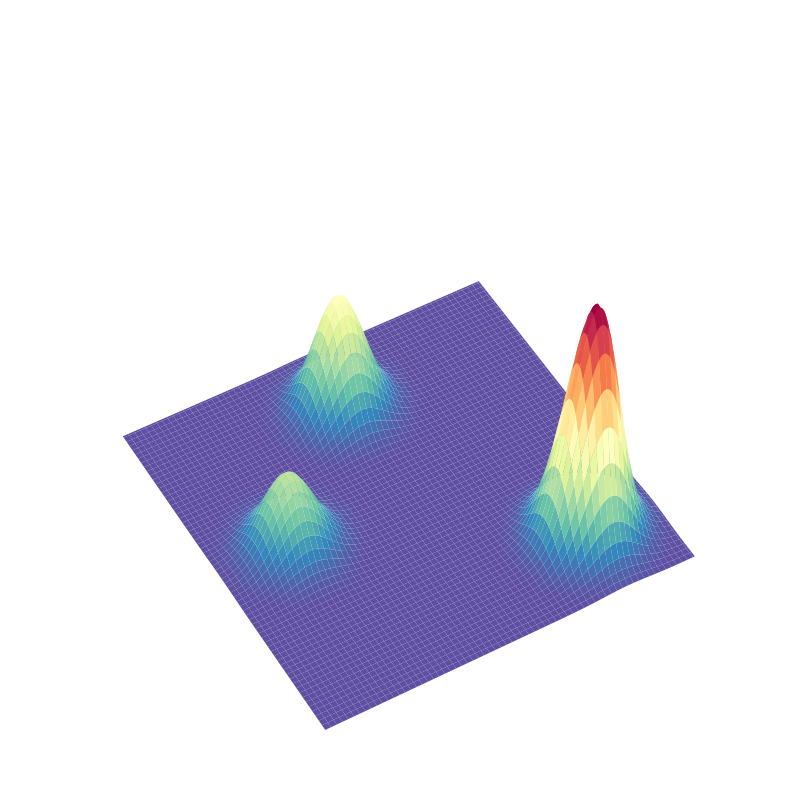

In [2]:
# Set up Mixture of Gaussians
pi = np.array([0.2, 0.3, 0.6], dtype=np.float32)
mu = np.array([[-5, 0],
               [0, 5],
               [5, -5]], dtype=np.float32)
sigma = np.array([[1, 1],
                  [1, 1],
                  [1, 1]], dtype=np.float32)
gmm = tfd.MixtureSameFamily(
    mixture_distribution=tfd.Categorical(probs=pi),
    components_distribution=tfd.MultivariateNormalDiag(
        loc=mu,
        scale_diag=sigma)
)

# Display Mixture of Gaussians
fig = plt.figure(figsize=(8, 8))
ax1 = fig.add_subplot(1,1,1,projection='3d',aspect='auto')

N = 200
X = np.linspace(-8, 8, N)
Y = np.linspace(-8, 8, N)
X, Y = np.meshgrid(X, Y)
coords = tf.stack([X, Y], axis=-1)
Z = gmm.prob(tf.cast(coords, tf.float32))

ax1.plot_surface(X, Y, Z, rstride=3, cstride=3, linewidth=0, antialiased=True,
                cmap=cm.Spectral_r, alpha=1.0)

ax1.view_init(50,-120)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_zticks([])

color_tuple = (1.0, 1.0, 1.0, 0.0)

ax1.xaxis.set_pane_color(color_tuple)
ax1.yaxis.set_pane_color(color_tuple)
ax1.zaxis.set_pane_color(color_tuple)
ax1.xaxis.line.set_color(color_tuple)
ax1.yaxis.line.set_color(color_tuple)
ax1.zaxis.line.set_color(color_tuple)

plt.tight_layout()
plt.show()

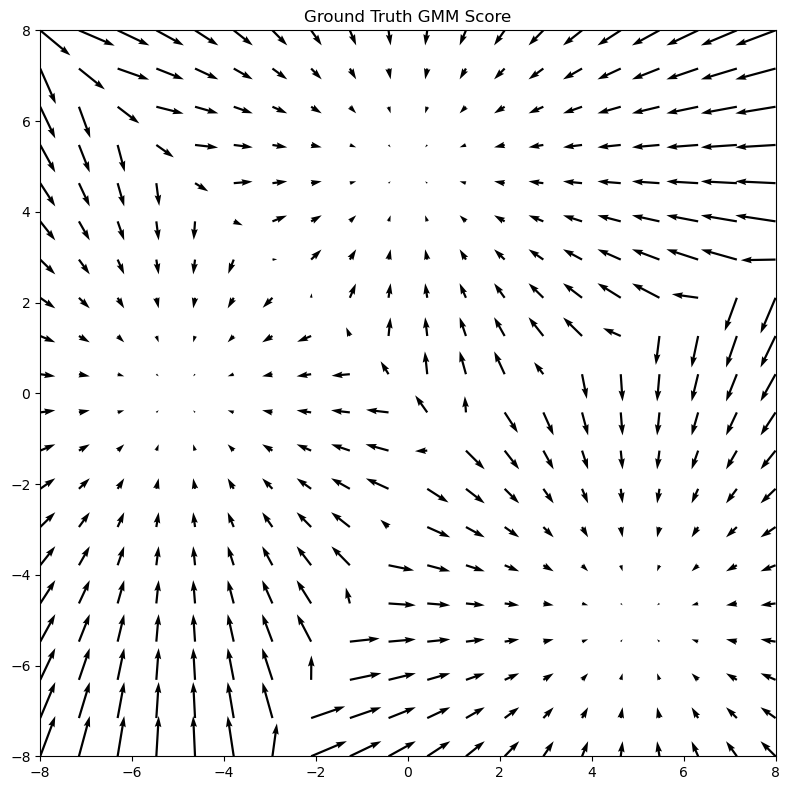

In [3]:
# Function to access ground truth score
def get_gt_score(inputs):
  with tf.GradientTape() as tape:
    tape.watch(inputs)
    log_prob = tf.reduce_sum(gmm.log_prob(inputs))
  gt_score = tape.gradient(log_prob, inputs)
  return gt_score

# Get grid coordinates, to visualize the flow field
granularity = 20
x_range = np.linspace(-8, 8, granularity, dtype=np.float32)
y_range = np.linspace(-8, 8, granularity, dtype=np.float32)
grid_x, grid_y = np.meshgrid(x_range, y_range)
grid_coords = tf.reshape(tf.stack([grid_x, grid_y], axis=-1), (-1, 2))

# Get ground truth flow field
gt_grid_score = get_gt_score(grid_coords)
gt_grid_score = tf.reshape(gt_grid_score, (granularity, granularity, -1))

# Plot the ground truth flow field
plt.figure(figsize=(8,8))
plt.title('Ground Truth GMM Score')
plt.quiver(grid_x, grid_y, gt_grid_score[...,0], gt_grid_score[...,1])
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.tight_layout()
plt.show()

In [4]:
# Step 1: Score Matching - Base Model

class MLP(tf.keras.models.Model):
  def __init__(self, dim_hidden, dim_out, activation='relu', **kwargs):
    super(MLP, self).__init__(**kwargs)
    self.dense1 = tfkl.Dense(dim_hidden, activation=activation)
    self.dense2 = tfkl.Dense(2 * dim_hidden, activation=activation)
    self.dense3 = tfkl.Dense(dim_hidden, activation=activation)
    self.dense4 = tfkl.Dense(dim_out)
  def call(self, input, **kwargs):
    x = self.dense4(self.dense3(self.dense2(self.dense1(input))))
    return x

class ScoreNetworkBase(tf.keras.models.Model):
  def __init__(self, hidden_dim, out_dim, dir='score_network', activation='relu', **kwargs):
    super(ScoreNetworkBase, self).__init__(**kwargs)

    # For Plotting
    self.dir = dir
    self.filenames = []
    if os.path.exists(dir):
      shutil.rmtree(dir)
    os.makedirs(dir)

    self.mlp = MLP(hidden_dim, out_dim, activation=activation)

  def call(self, x, **kwargs):
    x = self.mlp(x)
    return x

  def langevin_dynamics(self, x, c=None, num_steps=None):
    # TODO (Step 3): Implement langevin dynamics sampling
    # Suggestion: update default values for c and num_steps that make sense.
    pass

  def train_step(self, x):
    pass

  def test_step(self, x, iter=0):
    # Compute predictions
    y_pred = self(x, training=False)
    y = get_gt_score(x)
    self.plotting(y, y_pred, iter, plot_gt=True)

    self.compiled_loss(y, y_pred, regularization_losses=self.losses)
    self.compiled_metrics.update_state(y, y_pred)
    return {m.name: m.result() for m in self.metrics}

  def plotting(self, y, y_pred, iter, plot_gt=True):
    fig, axes = plt.subplots(1, 1)
    fig.set_size_inches(8, 8)
    fig.tight_layout(pad=2)

    ax = plt.subplot(1, 1, 1)
    ax.quiver(grid_x, grid_y, y_pred[...,0], y_pred[...,1], color='g')
    if plot_gt:
      ax.quiver(grid_x, grid_y, y[...,0], y[...,1], alpha=0.5)
    ax.set_xlim(-8, 8)
    ax.set_ylim(-8, 8)

    ax.set_title(f'{self.dir}, iter {iter}')

    filename = f'{self.dir}/{iter}.png'
    self.filenames.append(filename)
    
    fig.savefig(filename)
    plt.close()

In [5]:
# Step 1: Score Matching - Models

class GroundTruthScoreNetwork(ScoreNetworkBase):
  def __init__(self, hidden_dim, out_dim, dir='gt_score_matching', **kwargs):
    super(GroundTruthScoreNetwork, self).__init__(hidden_dim, out_dim, dir=dir, **kwargs)
    
  def train_step(self, x):
    # Define how we get the ground-truth score signal
    y = get_gt_score(x)

    with tf.GradientTape() as tape:
      y_pred = self(x, training=True)  # Forward pass
      loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

    # Compute gradients
    trainable_vars = self.trainable_variables
    gradients = tape.gradient(loss, trainable_vars)
    self.optimizer.apply_gradients(zip(gradients, trainable_vars))
    self.compiled_metrics.update_state(y, y_pred)
    return {m.name: m.result() for m in self.metrics}

class DenoisingScoreNetwork(ScoreNetworkBase):
  def __init__(self, hidden_dim, out_dim, dir='denoising_score_matching', sigma=0.5, **kwargs):
    super(DenoisingScoreNetwork, self).__init__(hidden_dim, out_dim, dir=dir, **kwargs)
    self.sigma = sigma
    
  def train_step(self, x):
    # TODO (Step 1): Define how we get the ground-truth score signal
    noise = tf.random.normal(x.shape, stddev=self.sigma)
    y = - noise / (self.sigma ** 2)
    x_noised = x + noise

    with tf.GradientTape() as tape:
      # TODO (Step 1): Compute the score matching objective
      y_pred = self(x_noised, training=True)
      loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

    # Compute gradients
    trainable_vars = self.trainable_variables
    gradients = tape.gradient(loss, trainable_vars)
    self.optimizer.apply_gradients(zip(gradients, trainable_vars))
    self.compiled_metrics.update_state(y, y_pred)
    return {m.name: m.result() for m in self.metrics}

class HyvarinenScoreNetwork(ScoreNetworkBase):
  def __init__(self, hidden_dim, out_dim, dir='hyv_score_matching', **kwargs):
    super(HyvarinenScoreNetwork, self).__init__(hidden_dim, out_dim, dir=dir, activation='softplus', **kwargs)
    
  def train_step(self, x):

    # Hint: the persistent flag might be useful here.
    with tf.GradientTape() as tape:
      # TODO (Step 1): Compute the score matching objective
      y_pred = None
      loss = None
      # Hint: Calculate trace of batch jacobian of the score
      # Hint: Calculate norm of the predicted score

    # Compute gradients
    trainable_vars = self.trainable_variables
    gradients = tape.gradient(loss, trainable_vars)
    self.optimizer.apply_gradients(zip(gradients, trainable_vars))
    return {m.name: m.result() for m in self.metrics}

class SlicedScoreNetwork(ScoreNetworkBase):
  def __init__(self, hidden_dim, out_dim, dir='sliced_score_matching', **kwargs):
    super(SlicedScoreNetwork, self).__init__(hidden_dim, out_dim, dir=dir, activation='softplus', **kwargs)
    
  def train_step(self, x):
    v = None

    # Hint: the persistent flag might be useful here.
    with tf.GradientTape(persistent=True) as tape:
      # TODO (Step 1): Compute the score matching objective
      y_pred = None
      loss = None
      # Hint: Calculate norm of the predicted score

    # Compute gradients
    trainable_vars = self.trainable_variables
    gradients = tape.gradient(loss, trainable_vars)
    self.optimizer.apply_gradients(zip(gradients, trainable_vars))
    return {m.name: m.result() for m in self.metrics}

500000/500000 [==============================] - 20s 40us/step - loss: 3.5244


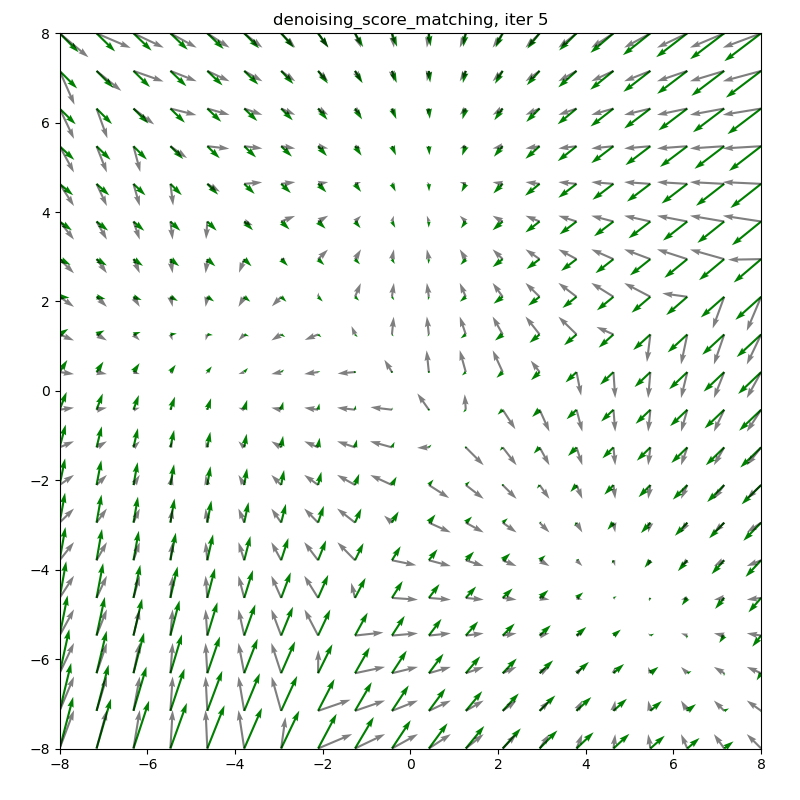

In [6]:
# Step 1: Score Matching - Train Loop

num_iters = 500
num_samples = 1000
batch_size = 128
lr = 0.005
opt = tf.keras.optimizers.Adam(learning_rate=lr)

# model = GroundTruthScoreNetwork(128, 2)
model = DenoisingScoreNetwork(128, 2)
# model = HyvarinenScoreNetwork(128, 2)
# model = SlicedScoreNetwork(128, 2)
model.compile(optimizer=opt, loss="mse")

# TODO (Step 1): Generate dataset as num_samples samples from the gmm
dataset = gmm.sample(num_samples)

pb = Progbar(num_samples * num_iters, stateful_metrics=['loss'])
for i in range(num_iters):
  # TODO (Step 1): Generate random batch of size batch_size from the dataset
  batch = tf.random.shuffle(dataset)[:batch_size]
  metrics = model.train_step(batch)
  pb.add(num_samples, values=[(k, v) for k,v in metrics.items()])

  if i > 0 and i % 5 == 0:
    test_metrics = model.test_step(grid_coords, iter=i)

# Generate GIF
with imageio.get_writer(f'{model.dir}.gif', mode='I') as writer:
  for filename in model.filenames:
    image = imageio.v2.imread(filename)
    writer.append_data(image)
Image(f'{model.dir}.gif')

[]

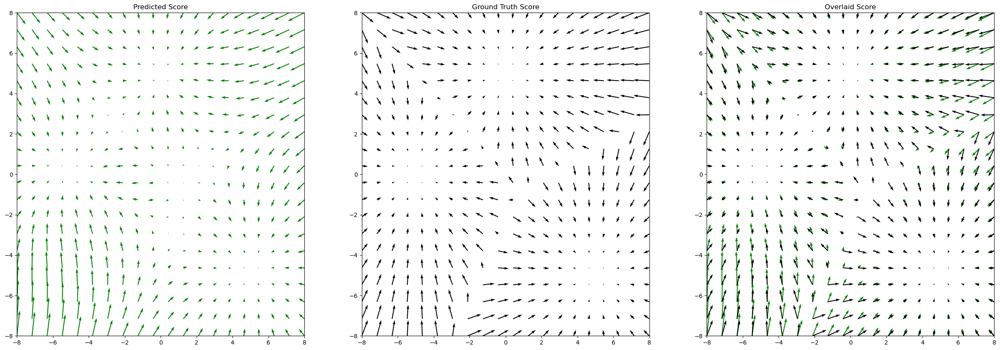

In [7]:
# Step 1: Score Matching - Sanity Visualization 

final_grid_pred = model(grid_coords, training=False)
plt.figure(figsize=(30,10))

plt.subplot(1, 3, 1)
plt.title("Predicted Score")
plt.quiver(grid_x, grid_y, final_grid_pred[...,0], final_grid_pred[...,1], color='g')
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.plot()

plt.subplot(1, 3, 2)
plt.title("Ground Truth Score")
plt.quiver(grid_x, grid_y, gt_grid_score[...,0], gt_grid_score[...,1])
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.plot()

plt.subplot(1, 3, 3)
plt.title("Overlaid Score")
plt.quiver(grid_x, grid_y, final_grid_pred[...,0], final_grid_pred[...,1], color='g')
plt.quiver(grid_x, grid_y, gt_grid_score[...,0], gt_grid_score[...,1])
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.plot()

In [8]:
# Step 2: Noise-Conditioned Score Matching - Model

class PosEmbedding(tf.keras.layers.Layer):
  def __init__(self, dim):
    super(PosEmbedding, self).__init__()
    self.dim = dim

  def call(self, time):
    dim = self.dim/2

    positions = tf.cast(tf.expand_dims(time, -1), tf.float32)
    dims = tf.expand_dims(tf.range(dim), 0)/dim
    
    angle_rates = 1 / (10000**dims)
    angle_rads = positions * angle_rates

    pos_encoding = tf.concat([tf.sin(angle_rads), tf.cos(angle_rads)], axis=-1)
    return tf.cast(pos_encoding, dtype=tf.float32)

class TimeEmbedding(tf.keras.models.Model):
  def __init__(self, hidden_dim, out_dim, **kwargs):
    super(TimeEmbedding, self).__init__(**kwargs)
    # TODO (Step 2): Instantiate a positional embedding model
    self.dense = tfkl.Dense(hidden_dim, activation="relu")
    self.out = tfkl.Dense(out_dim)
    self.pos_embed = PosEmbedding(dim=2)

  def call(self, input, **kwargs):
    # TODO (Step 2): Get the positional embedding for the time index and its embedding
    # Suggestion: input should be a integer time index
    # Suggestion: apply a dense layer to the output of the positional embedding
    positional_embedding = self.pos_embed(input, **kwargs)
    out = self.dense(positional_embedding)
    out = self.out(out)
    
    return out

class NCSN(ScoreNetworkBase):
  def __init__(self, hidden_dim, out_dim, dir='ncsn', noise_levels=10, **kwargs):
    super(NCSN, self).__init__(hidden_dim, out_dim, dir=dir, **kwargs)

    # TODO (Step 2): Create a time embedding model
    self.time_mlp = TimeEmbedding(16, 2)

    self.noise_levels = noise_levels
    self.variance_schedule = self.linear_schedule(noise_levels)[::-1]

  def linear_schedule(self, timesteps):
    lin_start = 0.5 # pre-chosen
    lin_end = 20 # pre-chosen
    return tf.cast(tf.linspace(lin_start, lin_end, timesteps), tf.float32)

  def call(self, x, time_idxs, **kwargs):
    # TODO (Step 2): Condition the score prediction on time
    # Hint: Try concatenating the time embedding with the input
    time_idxs = tf.ones(x.shape[0], dtype=tf.float32)* tf.cast(time_idxs + 1, tf.float32)
    time_embed = self.time_mlp(time_idxs, **kwargs)
    x_embed = tf.concat([x, time_embed], axis=-1)
    return self.mlp(x_embed, **kwargs)

  def train_step(self, x):
    # TODO (Step 2): Define how we get the ground-truth score signal
    # Hint: How does relate to Step 1?

    noises = tf.stack([
        tf.random.normal(shape=x.shape, stddev=sigma ** 0.5)
        for sigma in self.variance_schedule
    ])
    
    y = tf.stack([
        - noise / sigma for noise, sigma
        in zip(noises, self.variance_schedule)
    ])
    
    x_noised = x + noises
    
    with tf.GradientTape() as tape:
        y_pred = tf.stack([
            self(x_noised[i], i) for i in range(self.noise_levels)
        ])
        y = tf.reshape(y, (y.shape[0], -1))
        y_pred = tf.reshape(y_pred, (y_pred.shape[0], -1))
        
        loss = self.compiled_loss(
            y, y_pred, 
            regularization_losses=self.losses,
        )
#         loss = tf.reduce_sum(
#             self.variance_schedule ** 2 * tf.reduce_mean((y - y_pred) ** 2, axis=-1)
#         )


    # Compute gradients
    trainable_vars = self.trainable_variables
    gradients = tape.gradient(loss, trainable_vars)
    self.optimizer.apply_gradients(zip(gradients, trainable_vars))
    self.compiled_metrics.update_state(y, y_pred)
    return {m.name: m.result() for m in self.metrics}

  def langevin_dynamics(self, x, t_idx, c, num_steps=1000):
    # TODO (Step 3): Implement time-conditioned langevin dynamics sampling
    # Suggestion: update default values for c and num_steps that make sense.
    for _ in range(num_steps):
      x += c / 2. * self(x, t_idx, training=False) + tf.sqrt(c) * tf.random.normal(x.shape)
    
    return x
    

  def annealed_langevin_dynamics(self, x, c=1e-1, return_intermediate=False, num_steps=1000):
    # TODO (Step 3): Implement annealed langevin dynamics sampling over self.noise_levels
    # TODO (Step 3): Add a flag to return all intermediate sampling steps, to visualize how samples are generated over noise levels.

    result = [x]
    sigmas = self.variance_schedule
    alphas = c * sigmas / sigmas[-1]
    for t in range(self.noise_levels):

      x = self.langevin_dynamics(x, t, alphas[t], num_steps)
      result.append(x)

    if return_intermediate:
      return result
    
    return x

500000/500000 [==============================] - 34s 67us/step - loss: 0.2265


/tmp/ipykernel_32292/3131777767.py:34: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(1, 3, 1)


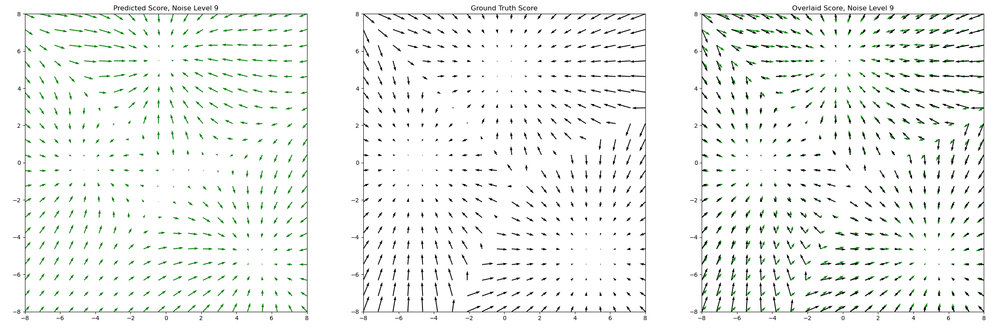

In [9]:
# Step 2: Noise-Conditioned Score Matching - Train Loop

num_iters = 500
num_samples = 1000
batch_size = 128
lr = 0.005
opt = tf.keras.optimizers.Adam(learning_rate=lr)

# TODO (Step 2): Choose an appropriate noise level
noise_levels = 10

model = NCSN(128, 2, noise_levels=noise_levels)
model.compile(optimizer=opt, loss="mse")

# TODO (Step 2): Generate dataset as num_samples samples from the gmm
dataset = gmm.sample(num_samples)

pb = Progbar(num_samples * num_iters, stateful_metrics=['loss'])
for i in range(num_iters):
  # TODO (Step 2): Generate random batch of size batch_size from the dataset
  batch = tf.random.shuffle(dataset)[:batch_size]
  metrics = model.train_step(batch)
  pb.add(num_samples, values=[(k, v) for k,v in metrics.items()])

# Plotting over noise levels
fnames = []
for i in range(model.noise_levels)[::-1]:
  final_grid_pred = model(grid_coords, tf.ones(grid_coords.shape[0], dtype=tf.int32) * i)

  fig, axes = plt.subplots(1, 1)
  fig.set_size_inches(24, 8)
  fig.tight_layout(pad=2)

  ax = plt.subplot(1, 3, 1)
  ax.set_title(f'Predicted Score, Noise Level {i}')
  ax.quiver(grid_x, grid_y, final_grid_pred[...,0], final_grid_pred[...,1], color='g')
  ax.set_xlim(-8, 8)
  ax.set_ylim(-8, 8)

  ax = plt.subplot(1, 3, 2)
  ax.set_title(f'Ground Truth Score')
  ax.quiver(grid_x, grid_y, gt_grid_score[...,0], gt_grid_score[...,1])
  ax.set_xlim(-8, 8)
  ax.set_ylim(-8, 8)

  ax = plt.subplot(1, 3, 3)
  ax.set_title(f'Overlaid Score, Noise Level {i}')
  ax.quiver(grid_x, grid_y, final_grid_pred[...,0], final_grid_pred[...,1], color='g')
  ax.quiver(grid_x, grid_y, gt_grid_score[...,0], gt_grid_score[...,1])
  ax.set_xlim(-8, 8)
  ax.set_ylim(-8, 8)

  fname = f'{model.dir}/final_{i}.png'
  fnames.append(fname)
  
  fig.savefig(fname)
  plt.close()

with imageio.get_writer(f'{model.dir}.gif', mode='I') as writer:
  for fname in fnames:
    image = imageio.v2.imread(fname)
    writer.append_data(image)
Image(f'{model.dir}.gif')

[]

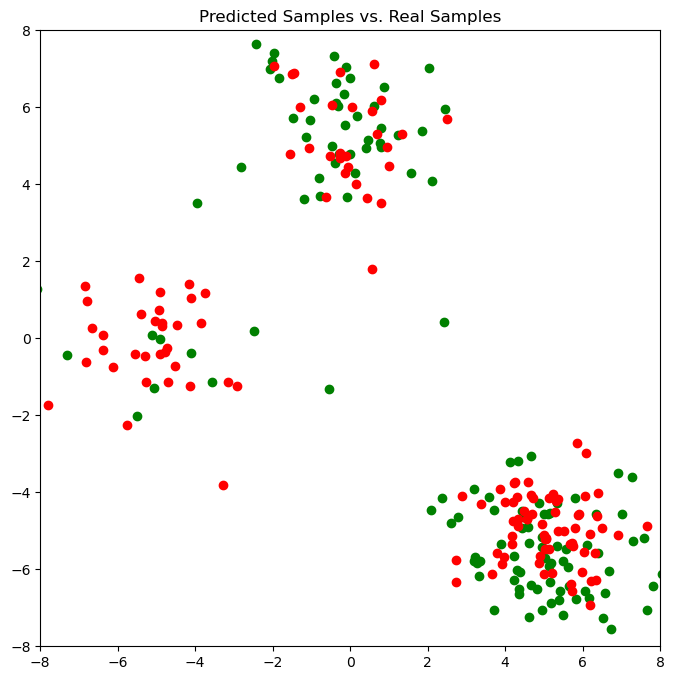

In [10]:
# Step 3: Langevin Dynamics Sampling - Visualize Samples
sample_count = 128

unif_rand_sample = tf.random.uniform((sample_count, 2), minval=-8, maxval=8)
pred_samples = model.annealed_langevin_dynamics(unif_rand_sample, c=0.1, num_steps=1000)
gt_samples = gmm.sample(sample_count)

plt.figure(figsize=(8,8))
plt.title("Predicted Samples vs. Real Samples")
plt.scatter(pred_samples[:, 0], pred_samples[:, 1], color='g')
plt.scatter(gt_samples[:, 0], gt_samples[:, 1], color='r')
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.plot()

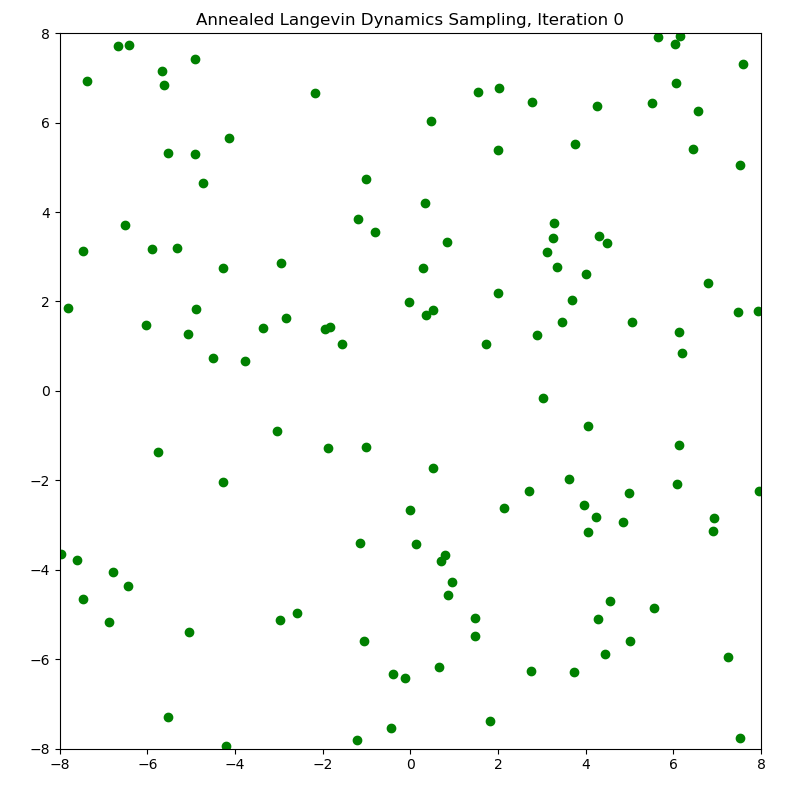

In [11]:
# Step 3: Langevin Dynamics Sampling - Visualize Sampling Over Noise Levels
sample_count = 128

unif_rand_sample = tf.random.uniform((sample_count, 2), minval=-8, maxval=8)
pred_samples = model.annealed_langevin_dynamics(unif_rand_sample, c=0.1, return_intermediate=True, num_steps=1000)

sample_fnames = []
for i in range(len(pred_samples)):

  fig, axes = plt.subplots(1, 1)
  fig.set_size_inches(8, 8)
  fig.tight_layout(pad=2)

  ax = plt.subplot(1, 1, 1)
  ax.set_title(f'Annealed Langevin Dynamics Sampling, Iteration {i}')
  ax.scatter(pred_samples[i][:, 0], pred_samples[i][:, 1], color='g')
  ax.set_xlim(-8, 8)
  ax.set_ylim(-8, 8)

  fname = f'{model.dir}/sample_{i}.png'
  sample_fnames.append(fname)
  
  fig.savefig(fname)
  plt.close()

with imageio.get_writer(f'{model.dir}.gif', mode='I') as writer:
  for fname in sample_fnames:
    image = imageio.v2.imread(fname)
    writer.append_data(image)
Image(f'{model.dir}.gif')